# Marketing Analytics

## Customer Segmentation of food delivery

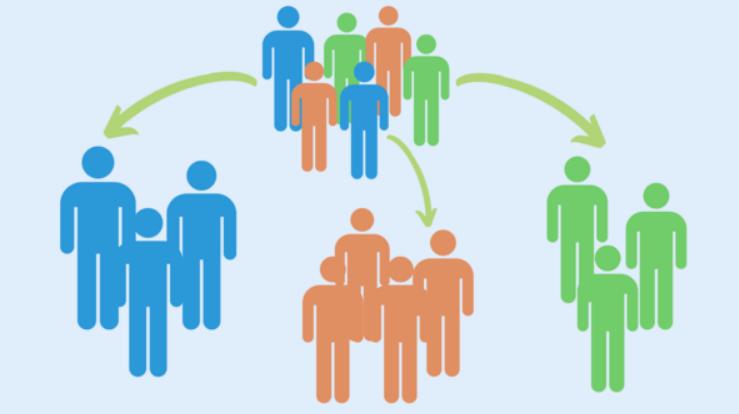

In [115]:
# Importing packages
import time
import datetime
import numpy as np
import pandas as pd
import matplotlib as m
import matplotlib.pyplot as plt
import seaborn as sns

# Graphic formatation
plt.style.use('fivethirtyeight')
plt.figure(1, figsize = (15,6))
%matplotlib inline

# Hiding warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [181]:
# Package versions (for reference)
%reload_ext watermark
%watermark -a "Packages versions used in this Jupyter Notebook:" --iversions

Author: Packages versions used in this Jupyter Notebook:

plotly    : 4.14.3
matplotlib: 3.4.2
pandas    : 1.2.2
numpy     : 1.21.6
seaborn   : 0.11.1
datetime  : 4.5
sklearn   : 0.24.2



### Lets starting loading the dataset

In [73]:
# Loading the dataset (path to your local file)
df_food_delivery = pd.read_csv('dados/dataset.csv', encoding = 'utf-8')

### Data Shape

In [74]:
# Shape
df_food_delivery.shape

(260645, 7)

### Data visualization

In [75]:
# Visualizing the data
df_food_delivery.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


### Data Dictionary

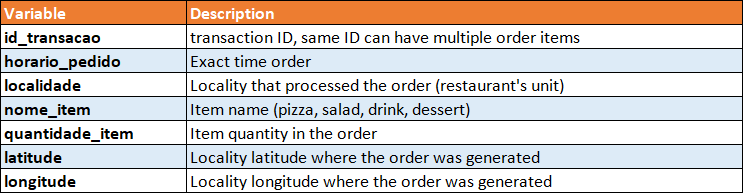

# What Should Be Done in Exploratory Analysis?

Exploratory Data Analysis refers to the process of carrying out initial investigations on data in order to discover patterns, detect anomalies, test hypotheses and verify assumptions with the help of statistical summaries and graphical representations.

Exploratory Data Analysis (EDA), also known as Data Exploration, is a step in the Data Analysis Process, where various techniques are used to better understand the dataset being used.

"Understanding the dataset" can refer to a number of things, including but not limited to:

• Extract important variables and leave useless variables behind (not all variables in the dataset will be relevant).

• Identify outliers, missing values ​​or human error.

• Understand the relationships, or lack of, between variables.

• Check the distribution and type of variables.

This allows you to maximize your understanding of a dataset and minimize potential errors that can occur later in the process.

# Exploratory Analysis

### Variable data types and statistical summary


Let's explore the data from different perspectives and understand a little more about the relationship between the variables.


Checking unique values in columns

In [76]:
# Verify total unique values by column
df_food_delivery.nunique()

id_transacao       100000
horario_pedido      76799
localidade              9
nome_item               4
quantidade_item         5
latitude                9
longitude               9
dtype: int64

Looking at id_transaction unique values whe can observe that every ID order has multiple items in the order, since we have 260645 registers in the dataset

In [77]:
# Data types
df_food_delivery.dtypes

id_transacao        object
horario_pedido      object
localidade           int64
nome_item           object
quantidade_item      int64
latitude           float64
longitude          float64
dtype: object

**Note: the types are inferred by Pandas when we load the dataset**

We can already see inconsistencies:

→ request_time: must be date type

latitude and longitude will not be a problem (although they are correct) as they will not be used in this problem

Lets see a statistics resume in the numeric columns

In [78]:
# Statistics resume in the numeric columns
df_food_delivery.describe()

,localidade,quantidade_item,latitude,longitude
count,260645.000000,260645.000000,260645.000000,260645.000000
mean,5.134904,2.447010,41.836095,-87.733930
std,2.551846,1.330863,0.144459,0.136369
min,1.000000,1.000000,41.524598,-88.010140
25%,3.000000,1.000000,41.784576,-87.849468
50%,5.000000,2.000000,41.881818,-87.677606
75%,7.000000,4.000000,41.889047,-87.627059
max,9.000000,5.000000,42.049306,-87.607565


Having a statistical summary of the location, for example, is not useful.

What if, for example, we had a transaction with 0 items?

The ideal would be to discuss with the Business area responsible for clarify about or whoever is responsible for defining how the data is collected, as this could be an error.

We also noticed that the maximum number of items in an order was 5 items.

### Building a pivot table

We will start creating a table that will provide the number of times which an item was requested in every order

In [79]:
# Generating a list to receive the total orders
total_orders = []

Loop to create a pivot table to totalize item per transaction.

First loop: we will do a grouping by column id_transacao in the dataset

In [80]:
%%time

print('\nInitializing the grouping to calculate the total orders. Be patient and hold on...')

# Extract every id and group of 'group by' by id_transaction
for k, group in df_food_delivery.groupby('id_transacao'):
    # Extract every id e group of 'group by' by horario_pedido
    for m, n in group.groupby('horario_pedido'):
        # Extract every item of each group
        id_transacao = k
        horario_pedido = m
        localidade = n['localidade'].values.tolist()[0]
        bebida = 0
        pizza = 0
        sobremesa = 0
        salada = 0
        n = n.reset_index(drop = True)
        
        # So we count the items in the orders
        for i in range(len(n)):
            item = n.loc[i, 'nome_item']
            num = n.loc[i, 'quantidade_item']
            
            if item == 'bebida':
                bebida = bebida + num
                
            elif item == 'sobremesa':
                sobremesa = sobremesa + num
                
            elif item == 'pizza':
                pizza = pizza + num
                
            elif item == 'salada':
                salada = salada + num
                
        output = [id_transacao, horario_pedido, localidade, bebida, pizza, sobremesa, salada]
        total_orders.append(output)
        
print('Grouping done!')


Initializing the grouping to calculate the total orders. Be patient and hold on...
Grouping done!
Wall time: 1min 43s


Second loop: we take the value of group to make another grouping by the id_transacao and then by the time_order:

→ let's get the value of k (these are the IDs of each transaction) and put it in id_transacao

→ m will be placed in order_time

→ we can have the same id_transacao at different times, this occurs when the consumer requests (as far as possible) a review after its order has been made

→ locale will be converted to a list

→ we will enter the initial values of each loop for drink, pizza, dessert and salad = 0

→ let's do a reset on n, n is the result of the grouping (dataframe)

Third loop: for every i value the length of n will follow what we count in the loop

We generate the output of every item (in the second loop)

total_orders keeps all items to go into output

Lets convert total_orders into a dataframe

In [81]:
# Converting column names into a dataframe
df_item_orders = pd.DataFrame(total_orders)

In [82]:
# Adding column names into dataframe
df_item_orders.columns = ['id_transacao', 'horario_pedido', 'localidade', 'bebida', 'pizza', 'sobremesa', 'salada']

In [83]:
# Checking the shape
df_item_orders.shape

(100000, 7)

Now we confirmed that the number of registers in the dataframe must match with the 100.000 transactions orders that we were aware previously

Lets verify unique values in order to compare with original data in the dataset

In [84]:
# Verify the total unique values by column
df_item_orders.nunique()

id_transacao      100000
horario_pedido     76799
localidade             9
bebida                 6
pizza                  6
sobremesa              5
salada                 6
dtype: int64

Printing original table

In [85]:
# Visualizing original data
df_food_delivery.head()

,id_transacao,horario_pedido,localidade,nome_item,quantidade_item,latitude,longitude
0,0x7901ee,2019-01-16 18:33:00,7,bebida,2,41.794132,-88.010140
1,0x7901ee,2019-01-16 18:33:00,7,pizza,2,41.794132,-88.010140
2,0x7901ee,2019-01-16 18:33:00,7,sobremesa,2,41.794132,-88.010140
3,0x12b47f,2019-09-04 12:36:00,3,salada,1,41.884490,-87.627059
4,0x12b47f,2019-09-04 12:36:00,3,sobremesa,1,41.884490,-87.627059


And we print the pivoted table

In [86]:
# Visualizing pivoted table
df_item_orders.head(10)

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0
5,0x1002af,2019-12-28 17:25:00,9,3,3,4,1
6,0x10034c,2019-03-12 18:17:00,5,3,4,4,0
7,0x100378,2019-10-13 18:44:00,4,4,4,5,1
8,0x100391,2019-10-10 18:07:00,5,4,4,4,0
9,0x1003a9,2019-06-23 00:39:00,6,0,2,2,0


We can observe that with a simple modification in the data already provide us a completely different perspective in the data. In practice, we just created a pivot table.

## So, is it possible simplify the creation of the pivot table?

In [87]:
# Original dataset shape (we keep it!)
df_food_delivery.shape

(260645, 7)

In [88]:
# Pivot table shape
df_item_orders.shape

(100000, 7)

In order to use the pivot table the object must be a Pandas type

In [89]:
# Type object
type(df_item_orders)

pandas.core.frame.DataFrame

Creating the pivot table from the original dataframe

In [90]:
# Create a pivot table with id_transacao, nome_item e quantidade_item
df_pivot = df_food_delivery.pivot_table(index = ['id_transacao'], columns = ['nome_item'], values = 'quantidade_item')

This is very similar to a typical SQL query, in which:

indice = id_transacao

coluna = nome_item
    
valores = quantidade_item

Due to a modification we made consenquently we need to adjust the index, we will reset it

In [91]:
# We will replace possible NA values generated in the pivot table to 0 and transform the column index
df_pivot = df_pivot.fillna(0).reset_index()

In [92]:
# Lets confirm
type(df_pivot)

pandas.core.frame.DataFrame

In [93]:
# Checking the column names
df_pivot.dtypes

nome_item
id_transacao     object
bebida          float64
pizza           float64
salada          float64
sobremesa       float64
dtype: object

In [94]:
# Checking the column names in the pivot table
df_pivot.columns

Index(['id_transacao', 'bebida', 'pizza', 'salada', 'sobremesa'], dtype='object', name='nome_item')

In [95]:
# Visualizing the data
df_pivot.head()

nome_item,id_transacao,bebida,pizza,salada,sobremesa
0,0x10000a,0.0,1.0,0.0,1.0
1,0x100058,0.0,2.0,0.0,2.0
2,0x1000c8,4.0,4.0,1.0,5.0
3,0x10014c,0.0,1.0,0.0,1.0
4,0x1001d8,3.0,3.0,0.0,3.0


In [96]:
# Unique values
df_pivot.nunique()

nome_item
id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
dtype: int64

In [97]:
# Data shape
df_pivot.shape

(100000, 5)

Lets check a statistic resume

In [98]:
# Describe the dataframe
df_pivot.describe()

nome_item,bebida,pizza,salada,sobremesa
count,100000.000000,100000.000000,100000.000000,100000.000000
mean,1.239590,1.857840,0.711370,2.569210
std,1.627886,1.588589,1.086524,1.332084
min,0.000000,0.000000,0.000000,1.000000
25%,0.000000,1.000000,0.000000,1.000000
50%,0.000000,1.000000,0.000000,2.000000
75%,3.000000,3.000000,1.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000


Checking null values

In [99]:
# We cant have null values
df_pivot.isnull().sum()

nome_item
id_transacao    0
bebida          0
pizza           0
salada          0
sobremesa       0
dtype: int64

Now we have to add the restaurant locality into this pivot table (dataset). How we do?

### Table Merge

We can use the merge method to solve this problem

Let's merge the df_pivot table with the original df_food_delivery dataset through the id_transacao and locality columns of both

In both tables there must be a column in common for the method to work

In [100]:
# We add localidade column and to merge it we need a commom column, in this case, id_transacao
df_pivot2 = df_pivot.merge(df_food_delivery[['id_transacao', 'localidade']])

In [101]:
# Lets check the new dataframe
df_pivot2.head()

,id_transacao,bebida,pizza,salada,sobremesa,localidade
0,0x10000a,0.0,1.0,0.0,1.0,9
1,0x10000a,0.0,1.0,0.0,1.0,9
2,0x100058,0.0,2.0,0.0,2.0,6
3,0x100058,0.0,2.0,0.0,2.0,6
4,0x1000c8,4.0,4.0,1.0,5.0,9


In [102]:
# Unique registers
df_pivot2.nunique()

id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
localidade           9
dtype: int64

### Extracting time granularity

The order time column has details such as month, day and year. At some point it may be interesting to segment by month, for instance. Let's then extract the month and put it in a separate column.

To get the date column down to the month level, we need to make this variable decrease by one level.

Let's check how our current table looks like

In [103]:
# Dtaa visualization
df_item_orders.head()

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0


In it we see that there is no column with month separate from the complete date, let's separate it.

We will apply an anonymous function to each row of the dataframe in which the time stamp of the column horario_pedido will be extracted

The lambda function through x will take each date record and will apply the strftime function to do a separation on the data. This function will return only the month ('%m')

To do this, we first need to split the data column. Let's take the data column and let's separate each of its parts

After separating the numbers in strptime, we leave this function and the other function, strftime, will separately return only the month ('%m') indicated by us within the lambda function.

In [104]:
# Extracts the month from column horario_pedido e load it into a new column
df_item_orders['mes'] = df_item_orders['horario_pedido'].apply(
    lambda x: time.strftime('%m', time.strptime(x, '%Y-%m-%d %H:%M:%S')))

In [105]:
# Data visualization
df_item_orders.head()

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06


In [106]:
# Lets do the same procedure in which we will move the month column to the pivoted dataframe
df_pivot = df_pivot.merge(df_item_orders[['id_transacao', 'mes']])

In [107]:
# Checking the result
df_pivot.head()

,id_transacao,bebida,pizza,salada,sobremesa,mes
0,0x10000a,0.0,1.0,0.0,1.0,01
1,0x100058,0.0,2.0,0.0,2.0,05
2,0x1000c8,4.0,4.0,1.0,5.0,01
3,0x10014c,0.0,1.0,0.0,1.0,02
4,0x1001d8,3.0,3.0,0.0,3.0,06


In [108]:
# Checking unique values
df_pivot.nunique()

id_transacao    100000
bebida               6
pizza                6
salada               6
sobremesa            5
mes                 12
dtype: int64

We confirmed that mes column is correct

### Adjusting the index

To segment customer orders, we need an identification column for each record. We cannot use transaction_id, as this column represents valid data and is not a unique value, so it cannot be used as an index.

For that we have to create a new column within an index for every register in the dataset

In [109]:
# Checking the dataset
df_item_orders

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
...,...,...,...,...,...,...,...,...
99995,0xffe96,2019-01-05 19:28:00,4,4,4,4,0,01
99996,0xffeed,2019-08-08 00:42:00,2,0,1,1,0,08
99997,0xfff07,2019-05-04 00:48:00,2,1,1,1,0,05
99998,0xfff4d,2019-07-18 00:17:00,3,0,2,2,0,07


Lets observe the table index

In [110]:
# Index
df_item_orders.index

RangeIndex(start=0, stop=100000, step=1)

Let's create a new dataframe in which we will reset the index of the current table. This procedure will take the current table with its indexes and create a column with these indices in the table that will be created

In [120]:
# Reseting the current index and recording the result into another dataframe
df_item_orders_idx = df_item_orders.reset_index()

Done! Lets check it:

In [121]:
# Now we have a ID column with unique value for every register
df_item_orders_idx.head()

,index,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06


We see on the extreme left side of the table that Pandas had already indexed our table (it does this by default), but this index is a Pandas metadata which makes it difficult to use it in data manipulation. Creating a column with the indexes makes the manipulation work quite trivial, as we do with any column in Pandas.

As we can see below, df_item_orders wasn't modified:

In [122]:
# New dataset
df_item_orders

,id_transacao,horario_pedido,localidade,bebida,pizza,sobremesa,salada,mes
0,0x10000a,2019-01-29 00:48:00,9,0,1,1,0,01
1,0x100058,2019-05-05 00:08:00,6,0,2,2,0,05
2,0x1000c8,2019-01-28 19:24:00,9,4,4,5,1,01
3,0x10014c,2019-02-23 00:15:00,6,0,1,1,0,02
4,0x1001d8,2019-06-30 17:50:00,2,3,3,3,0,06
...,...,...,...,...,...,...,...,...
99995,0xffe96,2019-01-05 19:28:00,4,4,4,4,0,01
99996,0xffeed,2019-08-08 00:42:00,2,0,1,1,0,08
99997,0xfff07,2019-05-04 00:48:00,2,1,1,1,0,05
99998,0xfff4d,2019-07-18 00:17:00,3,0,2,2,0,07


# Descriptive Analysis

## Distplot with features used dor segmentation

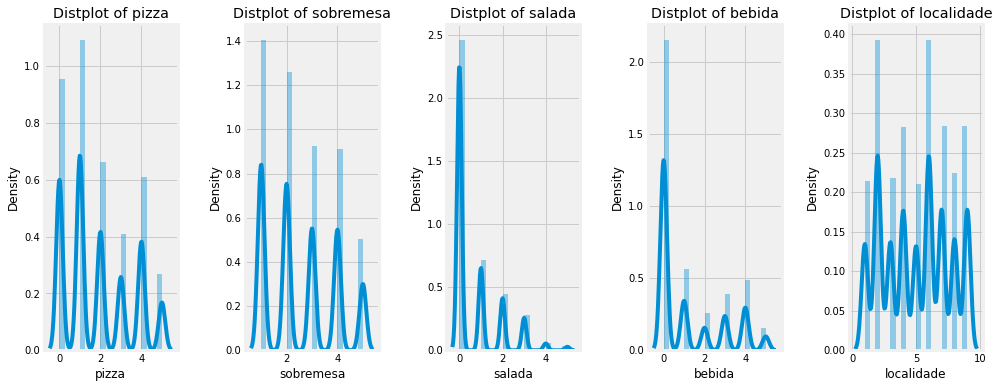

In [116]:
# Plot

# Figure size
plt.figure(1, figsize = (15,6))

# Inicializes the counter
n = 0

# Loop through columns
for x in ['pizza', 'sobremesa', 'salada', 'bebida', 'localidade']:
    n += 1
    # plot organization (iteratively we will generate 5 plots, according to the features)
    plt.subplot(1, 5, n)
    plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
    sns.distplot(df_item_orders[x], bins = 20)
    plt.title('Distplot of {}'.format(x))
plt.show()

### Insight:

When we look at each graph created we see that they have some waves. These waves mean that at certain times (late night, for example) demand drops a lot, so we see these waves

Depending on the type of trade, we will see very different patterns. For example, businesses that only work on weekdays (banks, government agencies, etc.)

We also observed that in the case of pizza, the waves are more uniform, this is because pizza appears in almost all orders. We can compare it with the salad, which has a much lower frequency in orders

The location distribution can indicate the places where demand is greater than in others, largely due to the location, which can mean that a certain delivery is in a more downtown region, with greater demand during working hours.

## Countplot of one of the features used for segmentation

Here we will create a countplot for univariate analysis in which we will have the total orders by location

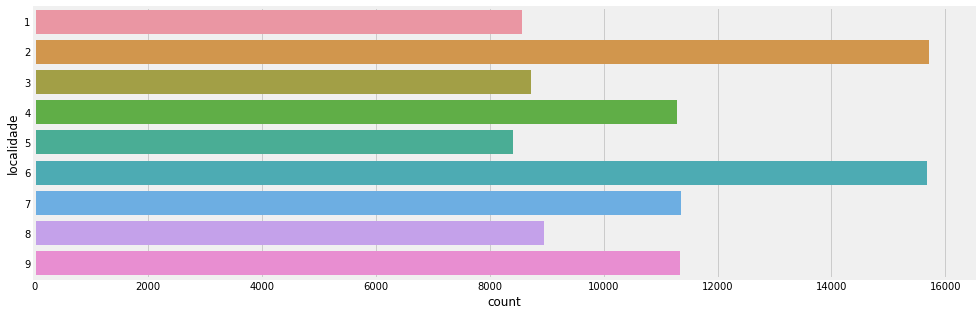

In [117]:
# Countplot
plt.figure(1, figsize = (15,5))
sns.countplot(y = 'localidade', data = df_item_orders)
plt.show()

## Insight:

We could observe:

* unities with bigger order number: 2 and 6
* unities with smaller order number: 5

## Regplot with features used for segmentation

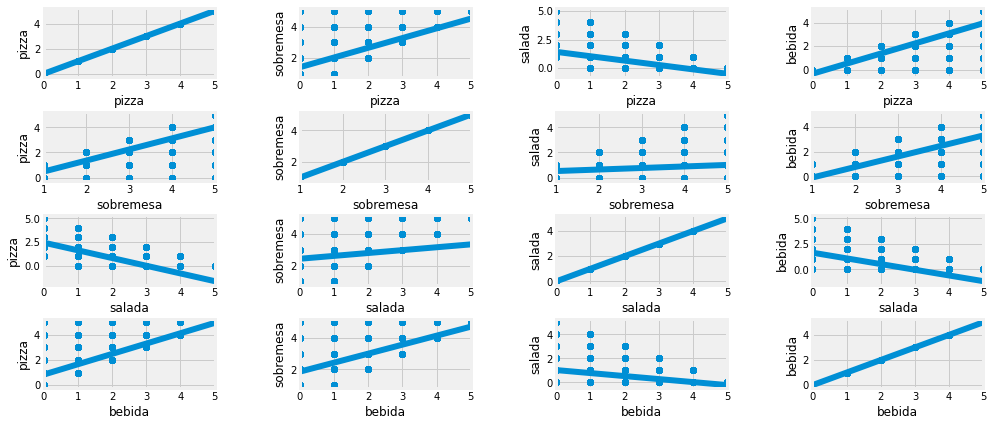

In [118]:
# Features relationship

# Figure size
plt.figure(11, figsize = (15,7))

# Initializes the counter
n = 0

# Loop through the features
for x in ['pizza', 'sobremesa', 'salada', 'bebida']:
    for y in ['pizza', 'sobremesa', 'salada', 'bebida']:
        n += 1
        plt.subplot(4, 4, n)
        plt.subplots_adjust(hspace = 0.5, wspace = 0.5)
        sns.regplot(x = x, y = y, data = df_item_orders)
        plt.ylabel(y)
plt.show()

In the same way as in a correlation matrix, we will go through the loop twice, once to generate the x-axis and once to generate the y-axis.

It's a regression plot, where we want to visualize the relationship (behavior) between pairs of features

Each one of the graphs that will be created is a regplot, just grouping all the regplots in a single plot area (4 x 4 area)

The diagonal represents the relationship of the feature to itself (we can ignore it)

For example, the pizza x dessert ratio, we notice that the greater the number of desserts in an order, the greater the number of pizzas in the same order.

If we look at the relationship between pizza and salad, we see a behavior contrary to pizza x dessert

Observing the dessert x salad relationship, we see a practically straight line, which indicates that there is practically no relationship between these data

## Defining the features for segmentation

Let's remove transaction_id, order_time, location and month for our first clustering activities

In [123]:
# Filtering the dataframe by columns
df_item_orders_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada']]

,index,bebida,pizza,sobremesa,salada
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0
...,...,...,...,...,...
99995,99995,4,4,4,0
99996,99996,0,1,1,0
99997,99997,1,1,1,0
99998,99998,0,2,2,0


In [124]:
# Lets save this filter into a new dataframe
df = df_item_orders_idx[['index', 'bebida', 'pizza', 'sobremesa', 'salada']]

In [125]:
# Previous check
df.head()

,index,bebida,pizza,sobremesa,salada
0,0,0,1,1,0
1,1,0,2,2,0
2,2,4,4,5,1
3,3,0,1,1,0
4,4,3,3,3,0


<b>Observation:</b> in clustering, usually, we use numeric values

# Cluster Analysis

Clustering is an unsupervised learning process, when we deliver to a Machine Learning algorithm only the input data and during training, the algorithm creates a model capable of generating outputs, in this case groups, or clusters.

In our problem we don't have information about the groups that order food delivery. This is information that we will need to extract from the data we have, we don't have this data explicitly (we don't have an output with these values).

Here supervised learning does not apply, we will have to adopt unsupervised learning.

Nothing prevents us from doing a clustering analysis even in a hypothetical situation where we have a way out. The opposite is also true, we could analyze this data more deeply and create an output value criterion for each data sample.


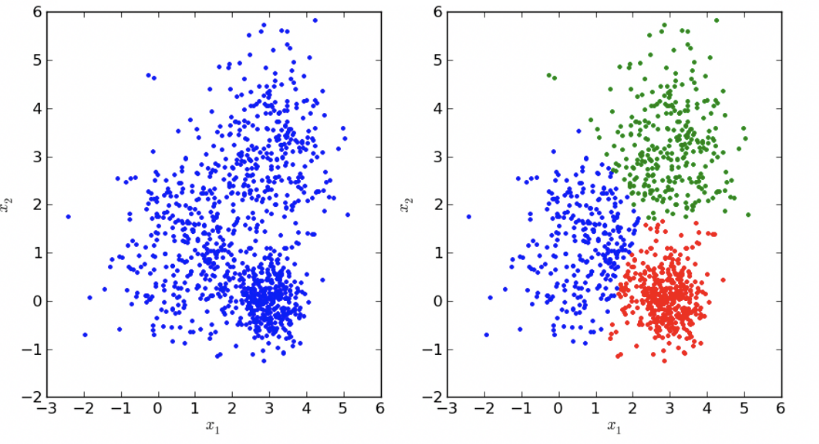

Looking at the example grouping above. In the graph on the right, in the red group, we observe a smaller distance between the points of this group, which can characterize a greater homogeneity of points within this group, but the points of the red group must have a greater distance for the green group and for the group blue

# Clustering Algorithms

## Clustering algorithm - k_Means

K-Means Clustering is an unsupervised machine learning algorithm. In contrast to traditional supervised machine learning algorithms, K-Means attempts to classify data without first being trained on labeled data. After the algorithm is run and the groups are defined, any new data can be easily assigned to the most relevant group.

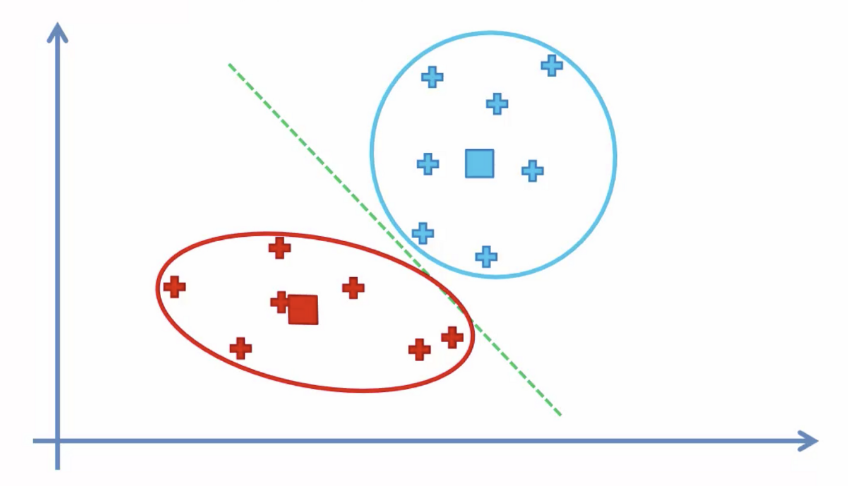

K-Means is probably the best-known clustering algorithm. It's easy to understand and implement!

- To get started, we first select a number of classes/groups that we want and randomly initialize their respective center points (centroids). To figure out the number of classes to use, it's good to take a quick look at the data and try to identify distinct groups.
- Each data point is sorted by calculating the distance between that point and each cluster center and then sorting the point in the cluster whose center is closest.
- Based on these sorted points, we recalculate the center of the group by averaging all vectors in the group.
- We repeat these steps for a set number of iterations or until the cluster centers do not change much between iterations. You can also choose to randomly initialize the cluster centers a few times and select the run that seems to have given the best results.

K-Means has the advantage of being very fast, as we are actually calculating the distances between points and cluster centers; there are few calculations! Therefore, it has a linear complexity O(n).

On the other hand, K-Means has some drawbacks. First you have to select how many groups/clusters. This isn't always trivial and ideally with a clustering algorithm we want it to figure them out because the goal is to get some information out of the data.

K-means also starts with a random choice of cluster centers and therefore may produce different cluster results in different runs of the algorithm. Thus, results may not be repeatable and lack consistency. Other clustering methods are more consistent.

K-Medians is another clustering algorithm related to K-Means, except that instead of recalculating the cluster midpoints using the mean, we use the cluster median vector. This method is less sensitive to outliers (because of using the Median) but is much slower for larger datasets as sorting is required on each iteration when calculating the Median vector.

Other Clustering Algorithms:

- Mean-Shift Clustering
     - we don't need to specify the number of clusters
     - it may be that the algorithm finds only one cluster in the data
    
- Density-Based Spatial Clustering of Applications with Noise (DBSCAN)
     - good for use in very noisy datasets, the algorithm will make a treatment so that these noises do not influence the clustering process
    
- Expectation–Maximization (EM) Clustering using Gaussian Mixture Models (GMM)
     - good to be applied in NLP (eg to do voice gender grouping)
    
- Agglomerative Hierarchical Clustering
     - takes the points and creates hierarchies until we have well-defined groups according to these hierarchies
     - the algorithm is not concerned with creating centroids

## Clustering metrics: Definition and Intepretation

# **Clustering Metrics Definition and Interpretation**

Below you will find the main metrics of cluster analysis and how to interpret them.

<b>Metric: Number of observations</b>

The number of observations in each cluster in the final partition.

<b>Interpretation:</b>

Examine the number of observations in each cluster when interpreting measures of variability such as mean distance and sum of squares within the cluster. The variability of a cluster can be affected by having a smaller or larger number of observations. For example, the sum of squares within the cluster becomes larger as more observations are added.

Examine clusters that have significantly fewer observations than other clusters. Clusters that have few observations may contain discrepancies or unusual observations with unique characteristics.

<b>Metric: Sum of squares within the cluster (Within cluster sum of squares)</b>

The sum of the squared deviations of each observation and the cluster centroid.

<b>Interpretation:</b>

The sum of squares within the cluster is a measure of the variability of observations within each cluster. In general, a cluster that has a small sum of squares is more compact than a cluster that has a large sum of squares. Clusters with higher values ​​exhibit greater variability of observations within the cluster.

However, similar to the sum of squares and mean squares in ANOVA, the sum of squares within the cluster is influenced by the number of observations. As the number of observations increases, the sum of squares becomes larger. Therefore, the sum of squares within the cluster is generally not directly comparable between clusters with different numbers of observations. To compare within-cluster variability of different clusters, use the average distance from the centroid.

<b>Metric: Average distance from centroid</b>

The average of the distances of the observations to the centroid of each cluster.

<b>Interpretation:</b>

The average distance of observations to the cluster centroid is a measure of the variability of observations within each cluster. In general, a cluster that has a shorter average distance is more compact than a cluster that has a longer average distance. Clusters with higher values exhibit greater variability of observations within the cluster.

<b>Metric: Cluster centroid</b>

The middle of a cluster. A centroid is a vector that contains a number for each variable, and each number is the mean of a variable for the observations in that cluster. The centroid can be considered the multidimensional mean of the cluster.

<b>Interpretation:</b>

Use the cluster centroid as a general measure of cluster location and to help interpret each cluster. Each centroid can be seen as representing the "average observation" within a cluster across all variables in the analysis.

<b>Metric: Distances between cluster centroids</b>

The distances between cluster centroids measure the distance between cluster centroids in the final partition.

<b>Interpretation:</b>

While the distance values are not very informative, you can compare the distances to see how different the clusters are. A greater distance generally indicates a greater difference between clusters.

## Segmentation - Defining the number of features

### Segmentation 1


Let's perform our first segmentation using 2 attributes

#### Segmentation 1 - Defining the Number of Attributes

Using 2 attributes (Pizza and Dessert).

<b>Note:</b> the fact that we are choosing two variables does not mean that we have to create two groups, the number of variables is information completely independent of the number of segmentation groups that we will create

In [127]:
# We will use two attributes
X1 = df[['pizza', 'sobremesa']].iloc[:,:].values

In [128]:
# We will create an empty list to save o WCSS (Within Cluster Sum of Squares)
wcss_X1 = []

Often, the data you work with has multiple dimensions, making it hard to visualize. As a consequence, the optimal number of clusters is not very obvious. Fortunately, we have a way to determine this mathematically.

We graph the relationship between the number of clusters and the sum of squares within the cluster (Within Cluster Sum of Squares - WCSS) and then select the number of clusters in which the change in WCSS starts to stabilize (Elbow Method).

#### Segmentation 1 - Finding the Optimal Value of Clusters

Let's test different K values (cluster values) between 2 and 15.


For the initialization of the clusters, we use the k-means++ algorithm that offers faster convergence to the final result.

[https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)


To find the ideal value of clusters, we will create a loop with a specific range of values of n that will be trained by the kmeans, in the end we will extract a metric (.inertia that is nothing more than WCSS) to make a comparison on which model has the best performance according to the number of clusters defined in the kmeans hyperparameter

In [129]:
# Importing machine learning libraries
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

In [130]:
# Loop to test the values of K
for n in range(2, 16):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan'))
    
    model.fit(X1)
    wcss_X1.append(model.inertia_)

kmeans++: is a good option to optimize the centroid initialization

## Segmentation 1: Interpreting the elbow curve

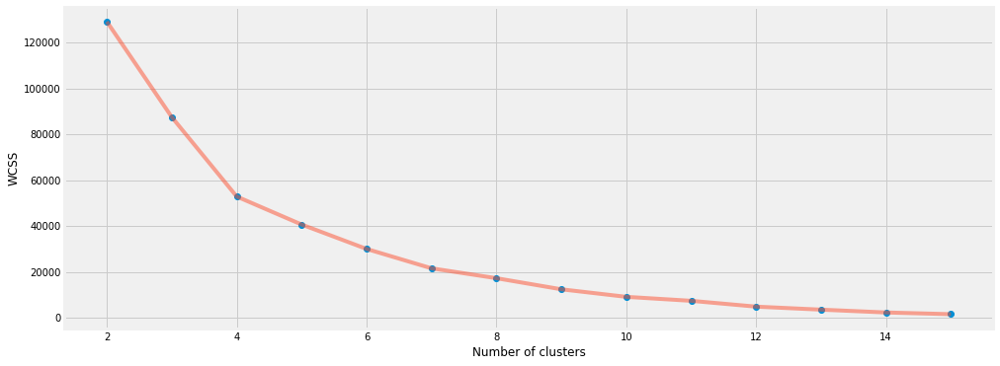

In [131]:
# Plotting the elbow curve
plt.figure(1, figsize = (15, 6))
plt.plot(np.arange(2, 16), wcss_X1, 'o')
plt.plot(np.arange(2, 16), wcss_X1, '-', alpha = 0.5)
plt.xlabel('Number of clusters'), plt.ylabel('WCSS')
plt.show()

→ we observe the values of wcss, which are the distances within each cluster, in this case we want the smallest possible value of wcss because we want homogeneous clusters

→ we see that for 14 clusters wcss presented the lowest value, so we have, among all the values tested, the cluster = 14 as the most homogeneous



We chose the optimal value of clusters and created the final model for Segment 1. Note in the graph above that there is no right or wrong. We could work with any value between 2 and 15 (it doesn't make sense to create just 1 cluster).

The graph above is called the Elbow Curve and we normally use the value with the smallest WCSS. But this must be aligned with business needs. For this example, it wouldn't make sense to use 15 clusters. Let's start with 2 clusters and evaluate and interpret the results.

# Segmentation 1: Building and training the model

We will proceed with the construction of the model, with the adoption of 2 clusters (business premise)

In [156]:
# Creating the model
model_seg1 = KMeans(n_clusters = 2,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan')

Training the model

In [157]:
# Training
model_seg1.fit(X1)

KMeans(algorithm='elkan', max_iter=500, n_clusters=2, n_init=15,
       random_state=10)

Lets extract the labels and centroids of the model

In [158]:
# Extracting the labels
labels1 = model_seg1.labels_
labels1

array([1, 1, 0, ..., 1, 1, 1])

In [159]:
# Extracting the centroids
centroids1 = model_seg1.cluster_centers_
centroids1

array([[3.79958153, 4.05580631],
       [0.881644  , 1.82183485]])

labels → are the groupings created by the model, determining the points at which there are characteristics similar to each other

centroids → the model created four centroids because the centroids are actually coordinates (X and Y)

## Segmentation 1 - Visualization, interpretation and segments analysis

Let's use meshgrid to build our graph

For Segment 1 we are using plt.cm.Set2

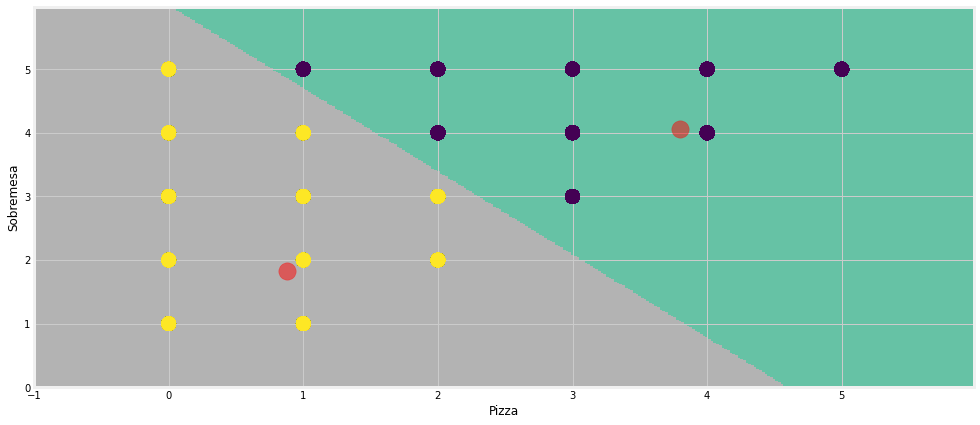

In [160]:
# PLot

# Meshgrid parameters
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg1.predict(np.c_[xx.ravel(), yy.ravel()])
plt.figure(1, figsize = (15, 7))
plt.clf()
Z = Z.reshape(xx.shape)

# Image plot
plt.imshow(Z,
           interpolation = 'nearest',
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set2,
           aspect = 'auto',
           origin = 'lower')

# Data points plot
plt.scatter(x = 'pizza', y = 'sobremesa', data = df, c = labels1, s = 200)
plt.scatter(x = centroids1[:, 0], y = centroids1[:, 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Sobremesa')
plt.show()

We can divide the meshgrid into 3 parts in its construction: parameter definition, image plot and the scatterplot with the points

⇒ In the parameters we have the definitions of the limits based on the data (X1), we create the meshgrid based on these limits, we create an object in which we have the model training (in ravel we have a method to change the shape of the x and y coordinates data), in the end we put everything in a Z named object


⇒ take this object and put it in imshow


⇒ in the plot we add the data labels with the groups we defined and add the centroids

**Graph interpretation:**

- we have two separate groups (gray and green) purple and yellow balls identifying the points of each group
- The red dot is the centroid of each cluster (segment)
- In cluster 1 (grey area) we have customers who ordered 0, 1 or 2 Pizzas. In all cases there was a request for Dessert (the yellow dot strayed in the pizza position = 2 will be ignored)
- In cluster 2 (green area) there are customers who ordered 1, 2, 3, 4 or 5 Pizzas. Note that as the order has a greater number of Pizzas, the number of Desserts also increases
- We have a clear definition of two groups here: one that buys less pizza and can buy more desserts and one that buys more pizza and buys more dessert

**Final analysis of segmentation 1:**

- Cluster 1 - Customers who order fewer Pizzas. Everyone orders dessert.
- Cluster 2 - Customers who order more Pizzas. Everyone orders dessert in larger volume.

Customers in the gray area can be considered customers who deserve more attention because they have a consumption pattern that is more difficult to define (some buy more dessert and others do not)

As a Marketing strategy, we could offer the customer a free dessert in case they buy another Pizza of greater value. Based on Segmentation, this strategy would likely be successful

# Segmentation 2: Analyzing segmentation with Pizza and Salada attributes

In [140]:
# Determining the attributes for Segmentaion 2
X2 = df[['pizza', 'salada']].iloc[:,:].values

In [141]:
# WCSS List
wcss_X2 = []

In [143]:
# Loop to test teh values of K
for n in range(2, 16):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan'))
    model.fit(X2)
    wcss_X2.append(model.inertia_)

### Elbows Curve for Segmentation 2

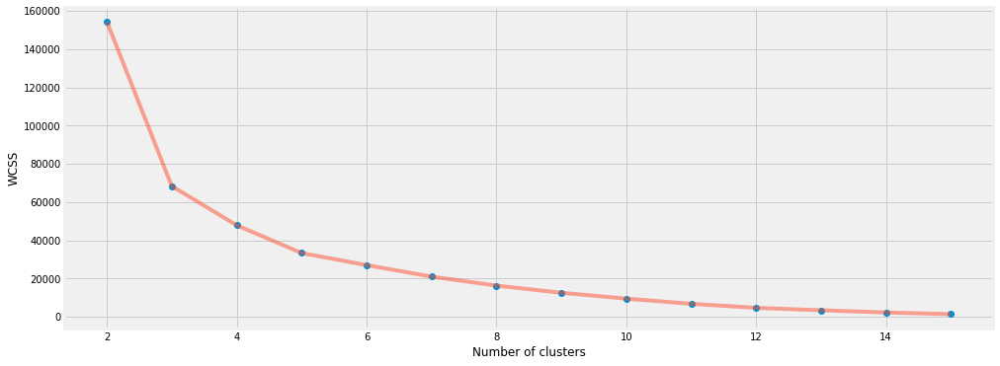

In [144]:
# Plotting segmentation 2
plt.figure(1, figsize = (15,6))
plt.plot(np.arange(2, 16), wcss_X2, 'o')
plt.plot(np.arange(2, 16), wcss_X2, '-', alpha = 0.5)
plt.xlabel('Number of clusters'), plt.ylabel('WCSS')
plt.show()

In [145]:
# Creating the model
model_seg2 = KMeans(n_clusters = 3,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan')

In [146]:
# Training the model
model_seg2.fit(X2)

KMeans(algorithm='elkan', max_iter=500, n_clusters=3, n_init=15,
       random_state=10)

In [147]:
# Extracting the labels
labels2 = model_seg2.labels_
labels2

array([2, 2, 0, ..., 2, 2, 2])

In [148]:
# Extracting the centroids
centroids2 = model_seg2.cluster_centers_
centroids2

array([[3.88929248, 0.14175282],
       [0.20043266, 2.11956596],
       [1.41384126, 0.12530064]])

Plotting Segmentation 2 (with 3 adjusted clusters)

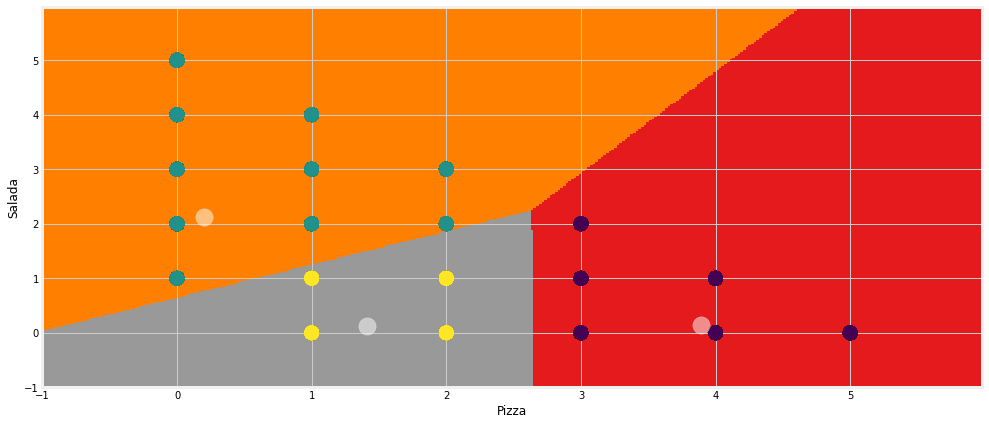

In [151]:
# Plot (Segmentation 2)

# Meshgrid parameters
h = 0.02
x_min, x_max = X2[:, 0].min() - 1, X2[:, 0].max() + 1
y_min, y_max = X2[:, 1].min() - 1, X2[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg2.predict(np.c_[xx.ravel(), yy.ravel()])
plt.figure(1, figsize = (15, 7))
plt.clf()
Z = Z.reshape(xx.shape)

# Image plot
plt.imshow(Z,
           interpolation = 'nearest',
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set1,
           aspect = 'auto',
           origin = 'lower')

# Data points plot
plt.scatter(x = 'pizza', y = 'salada', data = df, c = labels2, s = 200)
plt.scatter(x = centroids2[:, 0], y = centroids2[:, 1], s = 300, c = 'white', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Salada')
plt.show()

**Analysis**:

- Cluster 1 (orange): Customers who prefer more salads. Low consumption of Pizzas.
- Cluster 2 (grey): Customers with a low consumption profile, with a slight predominance of pizza.
- Cluster 3 (red): Customers who prefer pizza. Very low consumption of salads.


There is a negative correlation between Salads and Pizzas. As a Marketing strategy, we could focus on cluster 2, seeking to encourage an increase in pizza sales by offering a free salad to anyone who buys two pizzas.

# Segmentation 3: Analyzing segmentation with Pizza and Localidade attributes

In [152]:
# Adding the 'localidade' column to the current dataframe
df_seg3 = df.merge(df_item_orders_idx[['index', 'localidade']])

In [153]:
# Data Types
df_seg3.dtypes

index         int64
bebida        int64
pizza         int64
sobremesa     int64
salada        int64
localidade    int64
dtype: object

In [154]:
# Checking the statistics 
df_seg3.describe()

,index,bebida,pizza,sobremesa,salada,localidade
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,49999.500000,1.239590,1.857840,2.569210,0.711370,5.004700
std,28867.657797,1.627886,1.588589,1.332084,1.086524,2.544811
min,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000
25%,24999.750000,0.000000,1.000000,1.000000,0.000000,3.000000
50%,49999.500000,0.000000,1.000000,2.000000,0.000000,5.000000
75%,74999.250000,3.000000,3.000000,4.000000,1.000000,7.000000
max,99999.000000,5.000000,5.000000,5.000000,5.000000,9.000000


#### Elbow Curve for Segmentation 3

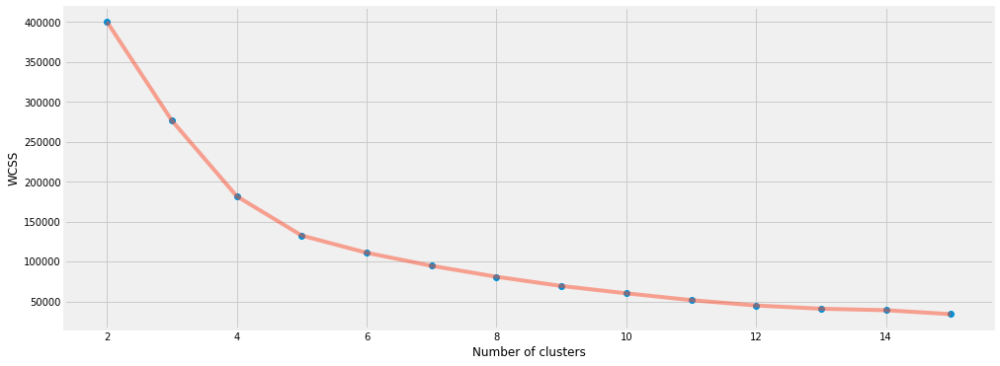

In [155]:
# Procedure for segmentation 3
X3 = df_seg3[['pizza', 'localidade']]

wcss_X3 = []

for n in range(2, 16):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan'))
    model.fit(X3)
    wcss_X3.append(model.inertia_)
    
# Plot
plt.figure(1, figsize = (15,6))
plt.plot(np.arange(2, 16), wcss_X3, 'o')
plt.plot(np.arange(2, 16), wcss_X3, '-', alpha = 0.5)
plt.xlabel('Number of clusters'), plt.ylabel('WCSS')
plt.show()

In [162]:
# Creating the model with 4 clusters
model_seg3 = KMeans(n_clusters = 4,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan')

# Training the model
model_seg3.fit(X3)

# Extracting the labels
labels3 = model_seg3.labels_

# Extracting the centroids
centroids3 = model_seg3.cluster_centers_

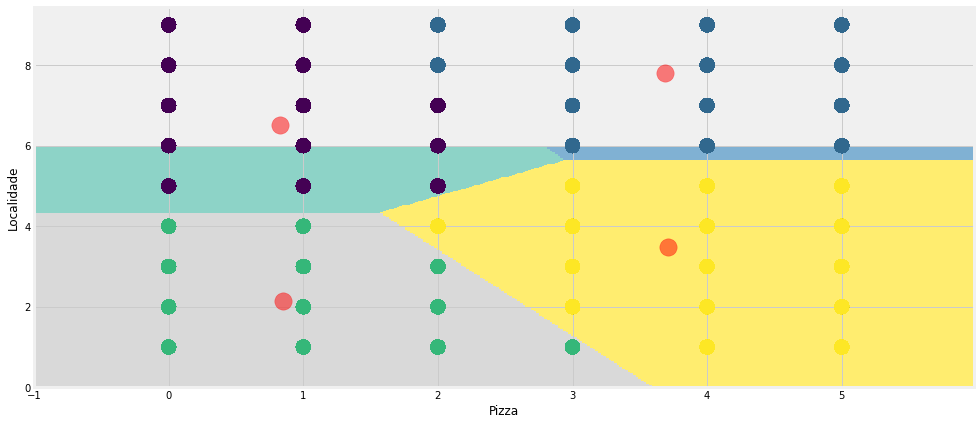

In [171]:
# PLot (Segmentation 3)

# Meshgrid parameters
h = 0.02
x_min, x_max = X1[:, 0].min() - 1, X1[:, 0].max() + 1
y_min, y_max = X1[:, 1].min() - 1, X1[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = model_seg3.predict(np.c_[xx.ravel(), yy.ravel()])
plt.figure(1, figsize = (15, 7))
plt.clf()
Z = Z.reshape(xx.shape)

# Image plot
plt.imshow(Z,
           interpolation = 'nearest',
           extent = (xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Set3,
           aspect = 'auto',
           origin = 'lower')

# Data points plot
plt.scatter(x = 'pizza', y = 'localidade', data = df_seg3, c = labels3, s = 200)
plt.scatter(x = centroids3[:, 0], y = centroids3[:, 1], s = 300, c = 'red', alpha = 0.5)
plt.xlabel('Pizza')
plt.ylabel('Localidade')
plt.show()

**Interpretation:**


- The red dot is the centroid of each cluster

- The clusters on the left contain orders with all Locations but with a smaller number of pizzas. The cluster on the right contains orders from all Locations but with the highest number of pizza orders

**Analysis:**


There is a lack of more detailed data so that we can better understand the clusters on the left so that we can increase the number of pizza orders, the distribution seems somewhat uniform in all locations, we do not see a large concentration of numbers of pizzas (larger or smaller) ) in some specific Locations.

# Segmentation 4 - Analyzing segmentation with Pizza, Salad and Locality attributes

We will follow the same procedures, we will only change the plot, in which we will use a 3D plot with Plotly

In [172]:
# Defining the attributes for Segmentation 4
X4 = df_seg3[['pizza', 'salada', 'localidade']].iloc[:,:].values

In [173]:
# WCSS List
wcss_X4 = []

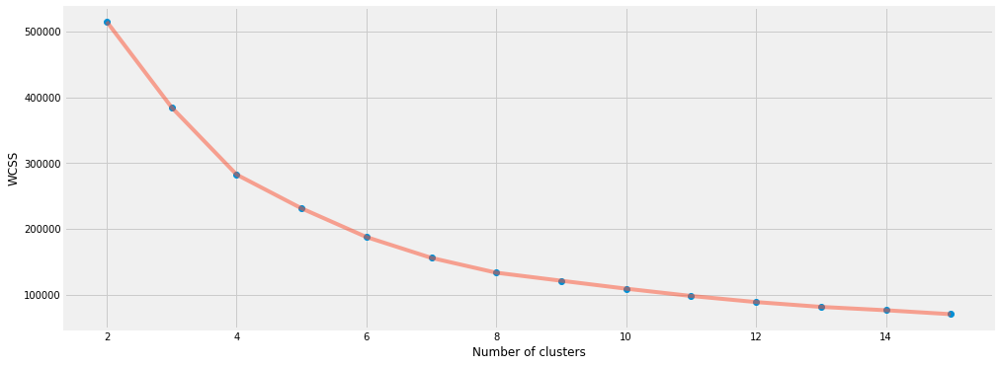

In [175]:
# Executing the loop in order to get Elbow Curve for Segmentation 4
for n in range(2, 16):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan'))
    model.fit(X4)
    wcss_X4.append(model.inertia_)
    
# Plot 
plt.figure(1, figsize = (15, 6))
plt.plot(np.arange(2, 16), wcss_X4, 'o')
plt.plot(np.arange(2, 16), wcss_X4, '-', alpha = 0.5)
plt.xlabel('Number of clusters'), plt.ylabel('WCSS')
plt.show()

In [176]:
# Generating the model for Segmentation 4
model_seg4 = KMeans(n_clusters = 4,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan')

model_seg4.fit(X4)
labels4 = model_seg4.labels_
centroids4 = model_seg4.cluster_centers_

In [179]:
# Checking the model for Segmentation 4
model_seg4

KMeans(algorithm='elkan', max_iter=500, n_clusters=4, n_init=15,
       random_state=10)

In [178]:
# Checking labels
labels4

array([0, 0, 2, ..., 1, 3, 1])

In [177]:
# Checking the centroids 
centroids4

array([[0.83938254, 1.02388077, 6.53411751],
       [0.81786942, 1.04080756, 2.14135607],
       [3.71034943, 0.14730419, 7.80321304],
       [3.65605011, 0.13266258, 3.42770522]])

The Meshgrid we've created so far is useful for two dimensions, but with 3 dimensions we need a more appropriate graph. A Scatter3d.

We will import Plotly for 3D plots

In [180]:
# Importing 3D graphics packages
import plotly as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected = True)

In [182]:
# Versions of the packages 
# Package versions (for reference)
%reload_ext watermark
%watermark -a "Packages versions used in this Jupyter Notebook:" --iversions

Author: Packages versions used in this Jupyter Notebook:

plotly    : 4.14.3
matplotlib: 3.4.2
pandas    : 1.2.2
numpy     : 1.21.6
seaborn   : 0.11.1
datetime  : 4.5
sklearn   : 0.24.2



In [183]:
# Plot for Segmentation 4

# 3D Graphic
graphic = go.Scatter3d(x = df_seg3['pizza'],
                       y = df_seg3['salada'],
                       z = df_seg3['localidade'],
                       mode = 'markers',
                       marker = dict(color = labels4,
                                     size = 4,
                                     line = dict(color = labels4, width = 15),
                                     opacity = 0.7))

# Graphic Layout
layout = go.Layout(title = 'Clusters Segmentacao 4',
                   scene = dict(xaxis = dict(title = 'Pizza'),
                                yaxis = dict(title = 'Salada'),
                                zaxis = dict(title = 'Localidade')))

# Figure plot (graphic + layout)
fig = go.Figure(data = graphic, layout = layout)
py.offline.iplot(fig)

**Interpretation:**

- We observed 2 upper clusters and 2 lower clusters
- Each data point represents a coordinate in 3 dimensions (x, y and z)


**Analysis**:

The ideal is to evaluate the graph interactively, taking advantage of this Plotly property, but there is a certain difficulty in reading the data in a 3-dimensional plot.

# Segmentation 5 - Analyzing segmentation with the attributes Pizza, Salad and Dessert

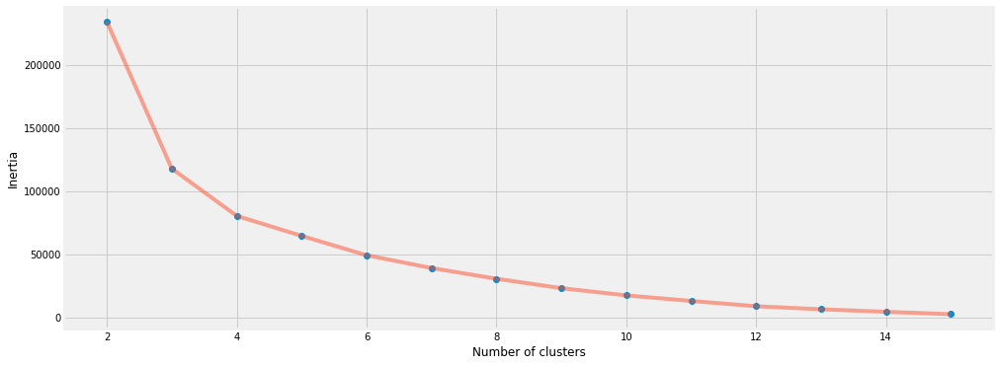

In [185]:
# Segmentation 5 with the attributes Pizza, Salada and Sobremesa
X5 = df_seg3[['pizza', 'salada', 'sobremesa']].iloc[:,:].values

# List with values of inertia (inertia and WCSS are the same)
inertia = []

# Executing the loop in order to get Elbow Curve for Segmentation 5
for n in range(2, 16):
    model = (KMeans(n_clusters = n,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan'))
    model.fit(X5)
    inertia.append(model.inertia_)
    
# Plot 
plt.figure(1, figsize = (15, 6))
plt.plot(np.arange(2, 16), inertia, 'o')
plt.plot(np.arange(2, 16), inertia, '-', alpha = 0.5)
plt.xlabel('Number of clusters'), plt.ylabel('Inertia')
plt.show()

In [186]:
# Generating the model for Segmentation 5
model_seg5 = KMeans(n_clusters = 2,
                    init = 'k-means++',
                    n_init = 15,
                    max_iter = 500,
                    tol = 0.0001,
                    random_state = 10,
                    algorithm = 'elkan')

model_seg5.fit(X5)
labels5 = model_seg5.labels_
centroids5 = model_seg5.cluster_centers_

In [187]:
# Plot for Segmentation 5

# 3D Graphic
graphic = go.Scatter3d(x = df_seg3['pizza'],
                       y = df_seg3['salada'],
                       z = df_seg3['sobremesa'],
                       mode = 'markers',
                       marker = dict(color = labels5,
                                     size = 4,
                                     line = dict(color = labels4, width = 15),
                                     opacity = 0.7))

# Graphic Layout
layout = go.Layout(title = 'Clusters Segmentacao 5',
                   scene = dict(xaxis = dict(title = 'Pizza'),
                                yaxis = dict(title = 'Salada'),
                                zaxis = dict(title = 'Sobremesa')))

# Figure plot (graphic + layout)
fig = go.Figure(data = graphic, layout = layout)
py.offline.iplot(fig)

**Interpretation:**

- We observed the clear separation of data into 2 clusters
- Each data point represents a coordinate in 3 dimensions (x, y and z)


**Analysis**:

The ideal is to evaluate the graph interactively, taking advantage of this Plotly property, but there is also a certain difficulty in reading the data in 3-dimensional plotting.

# Creating the final report (considering the Segmentation 5)

Checking the labels shape of Segmentation 5

In [188]:
# Labels shape 
labels5.shape

(100000,)

In [189]:
# Data types
type(labels5)

numpy.ndarray

Lets convert from array object to dataframe

In [191]:
# Converting into dataframe
df_labels = pd.DataFrame(labels5)

In [192]:
# Checking the dataframe
df_labels.head()

,0
0,1
1,1
2,0
3,1
4,0


In [194]:
# Object type
type(df_labels)

pandas.core.frame.DataFrame

We will add the other attributes in order to present the final result

We will merge the previous dataframe with the dataframe created with the outputs (labels) found by the model


It is important to remember that only 3 variables were used to create this segmentation


Although the dataframe with the created labels does not have a common column to merge, we will use the indices column as a reference


left_index = True -> df_seg3

right_index = True -> df_labels

In [195]:
# Merging the datasets
df_final = df_seg3.merge(df_labels, left_index = True, right_index = True)

In [196]:
# Final dataframe visualization
df_final

,index,bebida,pizza,sobremesa,salada,localidade,0
0,0,0,1,1,0,9,1
1,1,0,2,2,0,6,1
2,2,4,4,5,1,9,0
3,3,0,1,1,0,6,1
4,4,3,3,3,0,2,0
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,0
99996,99996,0,1,1,0,2,1
99997,99997,1,1,1,0,2,1
99998,99998,0,2,2,0,3,1


We need to identify more precisely the variable that contains the clusters

In [197]:
# Let's rename the column created with the identification of the output variable (clusters)
# If we did not use inplace = True, the change would only be made in memory
df_final.rename(columns = {0: 'cluster'}, inplace = True)

In [198]:
# Checking
df_final

,index,bebida,pizza,sobremesa,salada,localidade,cluster
0,0,0,1,1,0,9,1
1,1,0,2,2,0,6,1
2,2,4,4,5,1,9,0
3,3,0,1,1,0,6,1
4,4,3,3,3,0,2,0
...,...,...,...,...,...,...,...
99995,99995,4,4,4,0,4,0
99996,99996,0,1,1,0,2,1
99997,99997,1,1,1,0,2,1
99998,99998,0,2,2,0,3,1
